In [1]:
import sympy as sm
import sympy.physics.mechanics as me
me.init_vprinting(use_latex='mathjax')
import numpy as np
import math

In [2]:
La, Lb = sm.symbols('La, Lb')
tau1, tau2, Fx, Fy = sm.symbols('tau1, tau2, Fx, Fy')
q1, q2, u1, u2 = me.dynamicsymbols('q1, q2, u1, u2')

N = me.ReferenceFrame('N')
A = me.ReferenceFrame('A')
B = me.ReferenceFrame('B')

A.orient_axis(N, q1, N.z)
B.orient_axis(N, q2, N.z)

A.set_ang_vel(N, u1*N.z)
B.set_ang_vel(N, u2*N.z)

P0 = me.Point('P0')
P1 = me.Point('P1')
P2 = me.Point('P2')

P1.set_pos(P0, La*A.x)
P2.set_pos(P1, Lb*B.x)

P0.set_vel(N, 0)
P1.v2pt_theory(P0, N, A)
P2.v2pt_theory(P1, N, B)

t = me.dynamicsymbols._t

qdot_repl = {q1.diff(t): u1,
             q2.diff(t): u2}

R_P1 = 0*N.x 
R_P2 = -Fx*N.x - Fy*N.y 
T_A = tau1*N.z 
T_B = tau2*N.z 


points = [P1, P2]
forces = [R_P1, R_P2]


frames = [A, B]
torques = [T_A, T_B]


Fr_bar = []


for ur in [u1, u2]:

    Fr = 0


    for Pi, Ri in zip(points, forces):
        vr = Pi.vel(N).diff(ur, N)
        Fr += vr.dot(Ri)


    for Bi, Ti in zip(frames, torques):
        wr = Bi.ang_vel_in(N).diff(ur, N)
        Fr += wr.dot(Ti)

    Fr_bar.append(Fr)

Fr = sm.Matrix(Fr_bar)

q = sm.Matrix([q1, q2])
u = sm.Matrix([u1, u2])

qd = q.diff(t)
ud = u.diff(t)

ud_zerod = {udr: 0 for udr in ud}

In [3]:
Fr

⎡La⋅(Fx⋅sin(q₁) - Fy⋅cos(q₁)) + τ₁⎤
⎢                                 ⎥
⎣Lb⋅(Fx⋅sin(q₂) - Fy⋅cos(q₂)) + τ₂⎦

## Jacobian $J_x$ from kinetics

In [4]:
Fmat = sm.Matrix([Fx, Fy])
Jx = -sm.transpose(Fr.jacobian(Fmat))
Jx

⎡-La⋅sin(q₁)  -Lb⋅sin(q₂)⎤
⎢                        ⎥
⎣La⋅cos(q₁)   Lb⋅cos(q₂) ⎦

## Calculate Jacobian manually, compare with numerically evaluated
We want to manually evaluate the symbolic definition of the Jacobian, and then calculate using the finite difference approach

Closed-form expression, check 
$$ J_{X}(F_{x}, F_{y}) = \frac{\partial F_{r}}{\partial F_{mat}} $$

For calculation, let: 
$$ q_{1} = \frac{\pi}{4}, q_{2} = \frac{\pi}{4} = 0.6, L_{b} = 0.4, \tau_{1} = 0, \tau_{2} = 0 $$

In [6]:
Fr

⎡La⋅(Fx⋅sin(q₁) - Fy⋅cos(q₁)) + τ₁⎤
⎢                                 ⎥
⎣Lb⋅(Fx⋅sin(q₂) - Fy⋅cos(q₂)) + τ₂⎦

In [7]:
Fmat

⎡Fx⎤
⎢  ⎥
⎣Fy⎦

### Perform Substitution on the required variables 

In [12]:
Fr_eval = Fr.subs({La: 0.6, Lb: 0.4, q1: np.pi/4, q2: np.pi/4, tau1: 0, tau2: 0})
Fr_eval

⎡0.424264068711928⋅Fx - 0.424264068711929⋅Fy⎤
⎢                                           ⎥
⎣0.282842712474619⋅Fx - 0.282842712474619⋅Fy⎦

In [17]:
# Then calculate jacobian 
def calculate_symmetric_jacobian(Fr, Fx, Fy, dF = 0.0001): 

    # Result: 
    result = np.zeros((2, 2))

    # Evaluate the jacobian at the nominal value F by using symmetric finite difference
    # First evaluate without the step
    Fr_no_step = Fr.subs({Fx: 0.4, Fy: 0.6}) 
    print(Fr) 
    print(Fr_no_step)


In [18]:
calculate_symmetric_jacobian(Fr_eval, 0.4, 0.6)

Matrix([[0.424264068711928*Fx - 0.424264068711929*Fy], [0.282842712474619*Fx - 0.282842712474619*Fy]])
Matrix([[0.424264068711928*Fx - 0.424264068711929*Fy], [0.282842712474619*Fx - 0.282842712474619*Fy]])


## Jacobian $J_x$ from kinematics

In [5]:
umat = sm.Matrix([u1, u2])
Loopdots = sm.Matrix([P2.vel(N).dot(N.x), P2.vel(N).dot(N.y)])
Loopdots.jacobian(umat)

⎡-La⋅sin(q₁)  -Lb⋅sin(q₂)⎤
⎢                        ⎥
⎣La⋅cos(q₁)   Lb⋅cos(q₂) ⎦

In [6]:
kofq = sm.Matrix( [La*sm.cos(q1)+Lb*sm.cos(q2), La*sm.sin(q1)+Lb*sm.sin(q2)] )
kofq

⎡La⋅cos(q₁) + Lb⋅cos(q₂)⎤
⎢                       ⎥
⎣La⋅sin(q₁) + Lb⋅sin(q₂)⎦

In [7]:
Jx.free_symbols | kofq.free_symbols

{La, Lb, t}

In [8]:
p = sm.Matrix([La, Lb])
p

⎡La⎤
⎢  ⎥
⎣Lb⎦

In [9]:
eval_eom = sm.lambdify((q, p), [Jx, kofq])

In [10]:
r_center = La/2*N.x + La/2*N.y + 0.2*N.x
loop = P2.pos_from(P0) - r_center
loop

                  ⎛  La      ⎞       -La
Lb b_x + La a_x + ⎜- ── - 0.2⎟ n_x + ──── n_y
                  ⎝  2       ⎠        2

In [11]:
fhx = sm.trigsimp(loop.dot(N.x))
fhy = sm.trigsimp(loop.dot(N.y))
fh = sm.Matrix([fhx, fhy])
fh

⎡             La                   ⎤
⎢La⋅cos(q₁) - ── + Lb⋅cos(q₂) - 0.2⎥
⎢             2                    ⎥
⎢                                  ⎥
⎢                La                ⎥
⎢   La⋅sin(q₁) - ── + Lb⋅sin(q₂)   ⎥
⎣                2                 ⎦

In [12]:
repl = { La: 0.6, Lb: 0.4}
fh.xreplace(repl)

⎡0.6⋅cos(q₁) + 0.4⋅cos(q₂) - 0.5⎤
⎢                               ⎥
⎣0.6⋅sin(q₁) + 0.4⋅sin(q₂) - 0.3⎦

In [13]:
q1_guess = np.deg2rad(-30.0)
q2_guess = np.deg2rad(120.0)

sol = sm.nsolve(fh.xreplace(repl), (q1, q2), (q1_guess, q2_guess))
sol/math.pi*180.0

⎡-8.52551865016805⎤
⎢                 ⎥
⎣103.498794186874 ⎦

In [14]:
q_vals = np.array([
    np.deg2rad(-8.52),  # q1, rad
    np.deg2rad(103.49),  # q2, rad
])
q_vals, type(q_vals), q_vals.shape

(array([-0.14870205,  1.80624124]), numpy.ndarray, (2,))

In [15]:
q1_val, q2_val = q_vals
q1_val

-0.14870205226991687

In [16]:
p_vals = np.array([
    0.6,  # la, m
    0.4,  # Lb, m
])
p_vals, type(p_vals), p_vals.shape

(array([0.6, 0.4]), numpy.ndarray, (2,))

In [17]:
J_vals,  kofq_vals = eval_eom(q_vals, p_vals)
J_vals,  kofq_vals

(array([[ 0.08889278, -0.38896426],
        [ 0.59337852, -0.09331026]]),
 array([[0.50006826],
        [0.30007148]]))

In [18]:
kofq_vals, kofq_vals.shape

(array([[0.50006826],
        [0.30007148]]),
 (2, 1))

In [19]:
xdes = np.array([
    [0.3], 
    [0.3]
              ])
xdes, xdes.shape

(array([[0.3],
        [0.3]]),
 (2, 1))

In [20]:
K = 0.1*np.array([[1.0, 0.0],[0.0, 1.0]])
K

array([[0.1, 0. ],
       [0. , 0.1]])

In [47]:
def eval_rhs(t, x, p):
    # unpack the q vector from x
    q = x[:2]
    
    theta = 2*np.pi*0.5*t
    r = 0.25; 
    
    xdes = np.array([[0.3 + r*np.cos(theta)], [0.3 + r*np.sin(theta)]])

    J, kofq = eval_eom(q, p)
    K = 0.1*np.array([[1.0, 0.0],[0.0, 1.0]])
    
    qd = np.linalg.solve(J, 5.0*np.squeeze(xdes-kofq) )
    #qd = np.matmul(J.T , np.squeeze(xdes-kofq))

    # pack dq/dt into a new state time derivative vector dx/dt
    xd = np.empty_like(x)
    xd[:2] = qd


    return xd

In [22]:
t0=0.0
tf=4.0
delt=0.03
duration = tf - t0
num_samples = round(duration/delt) 
ts = np.arange(t0, t0 + delt*num_samples, delt)
ts.shape

(133,)

In [23]:
x0 = np.empty(2)
x0[:2] = q_vals
x0

array([-0.14870205,  1.80624124])

In [24]:
eval_rhs(t0, x0, p_vals)

array([-0.52467671, -3.33269347])

In [25]:
from scipy.integrate import solve_ivp

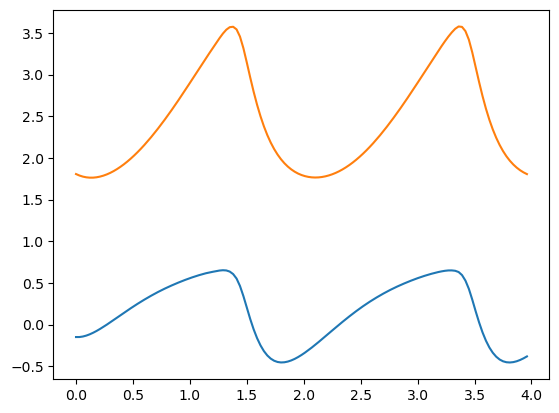

In [48]:
result = solve_ivp(eval_rhs, (t0, tf), x0, args=(p_vals,), t_eval=ts)
import matplotlib.pyplot as plt
plt.plot(result.t, np.transpose(result.y));
xs = np.transpose(result.y)

In [27]:
M = me.ReferenceFrame('M')
M.orient_axis(N, 0, N.z)

In [28]:
coordinates = P0.pos_from(P0).to_matrix(M)
for point in [P1, P2]:
    coordinates = coordinates.row_join(point.pos_from(P0).to_matrix(M))

eval_point_coords = sm.lambdify((q, p), coordinates)
eval_point_coords(q_vals, p_vals)
coordinates

⎡0  La⋅cos(q₁)  La⋅cos(q₁) + Lb⋅cos(q₂)⎤
⎢                                      ⎥
⎢0  La⋅sin(q₁)  La⋅sin(q₁) + Lb⋅sin(q₂)⎥
⎢                                      ⎥
⎣0      0                  0           ⎦

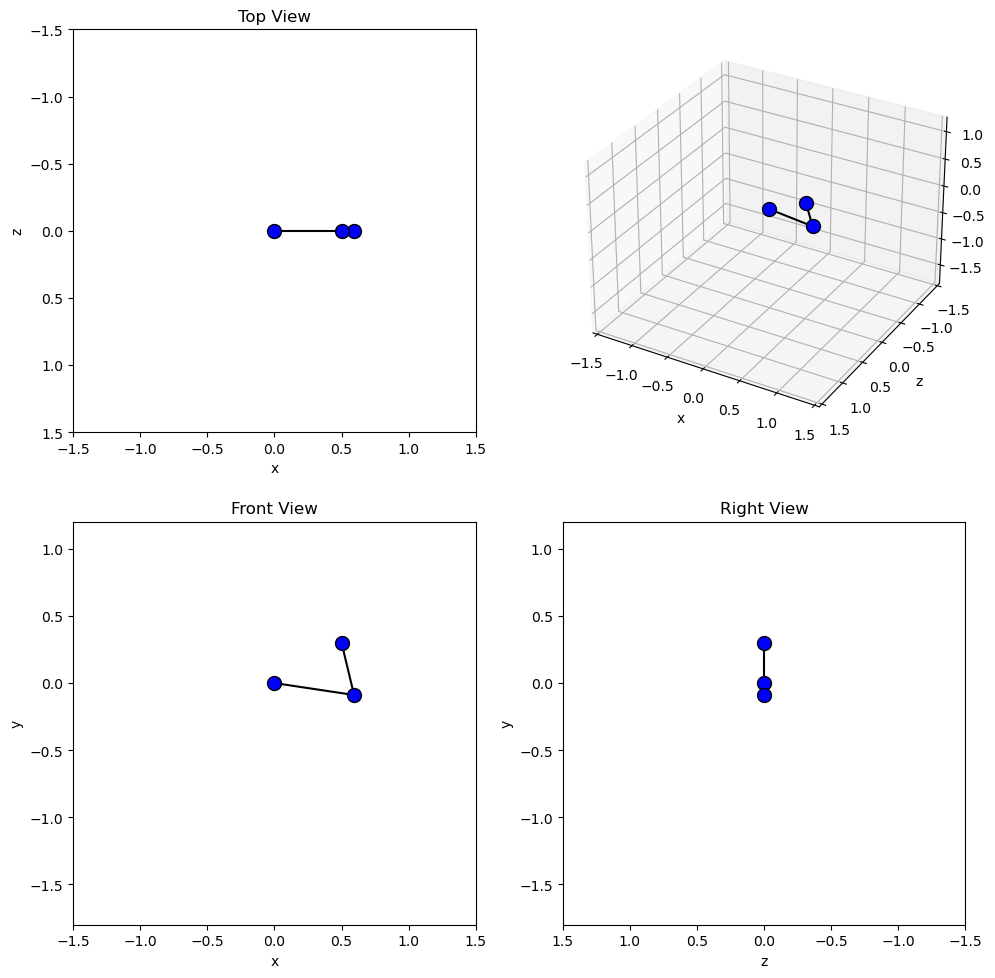

In [40]:
# initial configuration of the points
x, y, z = eval_point_coords(q_vals, p_vals)

# create a figure
fig = plt.figure()
fig.set_size_inches((10.0, 10.0))

# setup the subplots
ax_top = fig.add_subplot(2, 2, 1)
ax_3d = fig.add_subplot(2, 2, 2, projection='3d')
ax_front = fig.add_subplot(2, 2, 3)
ax_right = fig.add_subplot(2, 2, 4)

# common line and marker properties for each panel
line_prop = {
    'color': 'black',
    'marker': 'o',
    'markerfacecolor': 'blue',
    'markersize': 10,
}
axlim=1.5
# top view
lines_top, = ax_top.plot(x, z, **line_prop)
ax_top.set_xlim((-axlim, axlim))
ax_top.set_ylim((axlim, -axlim))
ax_top.set_title('Top View')
ax_top.set_xlabel('x')
ax_top.set_ylabel('z')
ax_top.set_aspect('equal')

# 3d view
lines_3d, = ax_3d.plot(x, z, y, **line_prop)
ax_3d.set_xlim((-axlim, axlim))
ax_3d.set_ylim((axlim, -axlim))
ax_3d.set_zlim((-1.8, 1.2))
ax_3d.set_xlabel('x')
ax_3d.set_ylabel('z')
ax_3d.set_zlabel('y')

# front view
lines_front, = ax_front.plot(x, y, **line_prop)
ax_front.set_xlim((-axlim, axlim))
ax_front.set_ylim((-1.8, 1.2))
ax_front.set_title('Front View')
ax_front.set_xlabel('x')
ax_front.set_ylabel('y')
ax_front.set_aspect('equal')

# right view
lines_right, = ax_right.plot(z, y, **line_prop)
ax_right.set_xlim((axlim, -axlim))
ax_right.set_ylim((-1.8, 1.2))
ax_right.set_title('Right View')
ax_right.set_xlabel('z')
ax_right.set_ylabel('y')
ax_right.set_aspect('equal')

fig.tight_layout()

In [41]:
from matplotlib.animation import FuncAnimation

In [42]:
def animate(i):
    x, y, z = eval_point_coords(xs[i, :2], p_vals)
    lines_top.set_data(x, z)
    lines_3d.set_data_3d(x, z, y)
    lines_front.set_data(x, y)
    lines_right.set_data(z, y)

In [43]:
ani = FuncAnimation(fig, animate, len(ts))

In [44]:
from IPython.display import HTML

HTML(ani.to_jshtml(fps=30))